# USA Surface Temperature Trends

Notebook by Will Geary. 

# Import Libraries

In [1]:
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
import pandas as pd
import numpy as np
import pymannkendall as mk
import contextily as ctx
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Data Sources

## Global Historical Climatology Network monthly (GHCNm)

The Global Historical Climatology Network monthly (GHCNm) dataset provides monthly climate summaries from thousands of weather stations around the world. The initial version was developed in the early 1990s, and subsequent iterations were released in 1997, 2011, and most recently in 2018. The period of record for each summary varies by station, with the earliest observations dating to the 18th century. Some station records are purely historical and are no longer updated, but many others are still operational and provide short time delay updates that are useful for climate monitoring. The current version (GHCNm v4) consists of mean monthly temperature data, as well as a beta release of monthly precipitation data.

National Centers for Environmental Information (NCEI) uses GHCN monthly to monitor long-term trends in temperature and precipitation. It has also been employed in several international climate assessments, including the Intergovernmental Panel on Climate Change 4th Assessment Report, the Arctic Climate Impact Assessment, and the "State of the Climate" report published annually by the Bulletin of the American Meteorological Society.

For this analysis, we will use GHCNm v3 so that we can analyze monthly maximum and minimum temperatures separately. Unfortunately, the current version (GHCNm v4) does not break out monthly maximum and minimum temperatures; it only provides monthly average temperatures. For this reason, our analyis will be limited to months prior to August 2019, when GHCNm v3 terminates.

Source: https://www.ncei.noaa.gov/products/land-based-station/global-historical-climatology-network-monthly

## Contiguous USA Boundary

For this analysis, we will focus on climate stations located within the Contiguous United States of America.

We will use a USA boundary shapefile sourced from the US Census Bureau.

Source: https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html

# Download the Data

## Monthly Maximum Temperature

We will use the "QCA" (Quality Control Adjusted) monthly data, which contain bias corrections made by GHCNM.

For more information, see the readme file: https://www.ncei.noaa.gov/pub/data/ghcn/v3/README

> V3 contains two different dataset files per each of the three elements. "QCU" files represent the quality controlled unadjusted data, and "QCA" files represent the quality controlled adjusted data. The unadjusted data are often referred to as the "raw" data. It is important to note that the term "unadjusted" means that the developers of GHCNM have not made any adjustments to these received and/or collected data, but it is entirely possible that the source of these data (generally National Meteorological Services) may have made adjustments to these data prior to their inclusion within the GHCNM.  Often it is difficult or impossible to know for sure, if these original sources have made adjustments, so users who desire truly "raw" data would need to directly contact the data source. The "adjusted" data contain bias corrected data (e.g. adjustments made by the developers of GHCNM), and so these data can differ from the "unadjusted" data.

Download the latest monthly maximum temperature data with a bash script:

In [2]:
!wget -P ./data/ https://www.ncei.noaa.gov/pub/data/ghcn/v3/ghcnm.tmax.latest.qca.tar.gz

--2023-04-20 11:39:40--  https://www.ncei.noaa.gov/pub/data/ghcn/v3/ghcnm.tmax.latest.qca.tar.gz
Resolving www.ncei.noaa.gov (www.ncei.noaa.gov)... 2610:20:8040:2::177, 2610:20:8040:2::171, 2610:20:8040:2::167, ...
Connecting to www.ncei.noaa.gov (www.ncei.noaa.gov)|2610:20:8040:2::177|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9304566 (8.9M) [application/gzip]
Saving to: ‘./data/ghcnm.tmax.latest.qca.tar.gz’

ghcnm.tmax.latest.q 100%[===================>]   8.87M  18.6MB/s    in 0.5s    

2023-04-20 11:39:41 (18.6 MB/s) - ‘./data/ghcnm.tmax.latest.qca.tar.gz’ saved [9304566/9304566]



Unzip the data with a bash script:

In [3]:
!tar -xzvf ./data/ghcnm.tmax.latest.qca.tar.gz -C ./data/

x ./ghcnm.v3.3.0.20190817/ghcnm.tmax.v3.3.0.20190817.qca.dat
x ./ghcnm.v3.3.0.20190817/ghcnm.tmax.v3.3.0.20190817.qca.inv


Remove the zipped file:

In [4]:
!rm ./data/ghcnm.tmax.latest.qca.tar.gz

## Monthly Minimum Temperature

Similarly, we will use the "QCA" (Quality Control Adjusted) monthly data for minimum temperatures as well.


Download the latest monthly minimum temperature data with a bash script:

In [5]:
!wget -P ./data/ https://www.ncei.noaa.gov/pub/data/ghcn/v3/ghcnm.tmin.latest.qca.tar.gz

--2023-04-20 11:39:44--  https://www.ncei.noaa.gov/pub/data/ghcn/v3/ghcnm.tmin.latest.qca.tar.gz
Resolving www.ncei.noaa.gov (www.ncei.noaa.gov)... 2610:20:8040:2::171, 2610:20:8040:2::167, 2610:20:8040:2::178, ...
Connecting to www.ncei.noaa.gov (www.ncei.noaa.gov)|2610:20:8040:2::171|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9261561 (8.8M) [application/gzip]
Saving to: ‘./data/ghcnm.tmin.latest.qca.tar.gz’

ghcnm.tmin.latest.q 100%[===================>]   8.83M  22.0MB/s    in 0.4s    

2023-04-20 11:39:45 (22.0 MB/s) - ‘./data/ghcnm.tmin.latest.qca.tar.gz’ saved [9261561/9261561]



Unzip the data with a bash script:

In [6]:
!tar -xzvf ./data/ghcnm.tmin.latest.qca.tar.gz -C ./data/

x ./ghcnm.v3.3.0.20190817/ghcnm.tmin.v3.3.0.20190817.qca.dat
x ./ghcnm.v3.3.0.20190817/ghcnm.tmin.v3.3.0.20190817.qca.inv


Remove the zipped file:

In [7]:
!rm ./data/ghcnm.tmin.latest.qca.tar.gz

## Contiguous USA Boundary

Download the USA boundary file:

In [8]:
!wget -P ./data/ https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip

--2023-04-20 11:39:46--  https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip
Resolving www2.census.gov (www2.census.gov)... 2600:1400:c000:19f::208c, 2600:1400:c000:1a3::208c, 104.66.235.36
Connecting to www2.census.gov (www2.census.gov)|2600:1400:c000:19f::208c|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘./data/cb_2018_us_state_500k.zip’

cb_2018_us_state_50     [ <=>                ]   3.15M  --.-KB/s    in 0.08s   

2023-04-20 11:39:47 (38.4 MB/s) - ‘./data/cb_2018_us_state_500k.zip’ saved [3304931]



Read the file into a GeoDataFrame:

In [9]:
filepath = "./data/cb_2018_us_state_500k.zip"
usa_states = gpd.read_file(filepath)

Convert it to WGS84 projection:

In [10]:
usa_states = usa_states.to_crs(4326)

Drop non-contiguous regions:

In [11]:
non_contiguous = ['Puerto Rico', 'American Samoa', 'United States Virgin Islands', 'Guam', 
                  'Commonwealth of the Northern Mariana Islands', 'Hawaii', 'Alaska']

contiguous_usa_states = usa_states[~usa_states['NAME'].isin(non_contiguous)].reset_index(drop=True)

Dissolve contiguous states into a single feature:

In [12]:
contiguous_usa = contiguous_usa_states.dissolve()[['geometry']]

Save to a GeoJSON file:

In [13]:
contiguous_usa_states.to_file("./data/contiguous_usa_states.geojson", driver='GeoJSON', index=False)
contiguous_usa.to_file("./data/contiguous_usa.geojson", driver='GeoJSON', index=False)

Delete the zipped file:

In [14]:
!rm ./data/cb_2018_us_state_500k.zip

# Read the Data

## Helper functions

In [15]:
def read_station_data(filepath):
    '''
    Reads GHCN station inventory data (i.e. "ghcnm.tmax.v3.3.0.20190817.qca.inv").
    Return a Pandas DataFrame.
    '''
    station_ids = []
    lats = []
    lons = []
    elevations = []
    with open(filepath) as f:
        data = f.read()
        lines = data.split("\n")
        for line in tqdm(lines[:-1]):
            fields = line.split()
            station_id = fields[0]
            lat = fields[1]
            lon = fields[2]
            elevation = fields[3]
            station_ids.append(station_id)
            lats.append(lat)
            lons.append(lon)
            elevations.append(elevation)

    station_df = pd.DataFrame()
    station_df['station_id'] = station_ids
    station_df['lat'] = lats
    station_df['lon'] = lons
    station_df['elevation'] = elevations
    geoms = gpd.points_from_xy(station_df['lon'], station_df['lat'])
    station_gdf = gpd.GeoDataFrame(station_df, geometry=geoms, crs=4326)
    return station_gdf

In [16]:
def read_ghcnm_data(filepath):
    '''
    Reads GHCNm monthly data (i.e "ghcnm.tmax.v3.3.0.20190817.qca.dat")
    Return a Pandas DataFrame.
    '''
    station_ids = []
    dates = []
    avg_temps = []

    with open(filepath) as f:
        data = f.read()
        lines = data.split("\n")
        for line in tqdm(lines[:-1]):
            station_id = line[0:11]
            year = line[11:15]
            jan = line[20:24]
            feb = line[28:32]
            mar = line[36:40]
            apr = line[44:48]
            may = line[52:56]
            jun = line[60:64]
            jul = line[68:72]
            aug = line[76:80]
            sep = line[84:88]
            oct = line[92:96]
            nov = line[100:104]
            dec = line[108:112]
            months = [jan, feb, mar, apr, may, jun, jul, aug, sep, oct, nov, dec]
            for i in range(len(months)):
                avg_temp = months[i]
                month_num = str(i+1).zfill(2)
                date = str(int(year)) + "-" + month_num + "-01"
                station_ids.append(station_id)
                dates.append(date)
                avg_temps.append(avg_temp)
    
    # Store data in a DataFrame
    df = pd.DataFrame()
    df['station_id'] = station_ids
    df['ds'] = dates
    df['y'] = avg_temps
    
    # replace missing temperature values with Nulls
    df['y'] = df['y'].replace('-9999',None)
    df['y'] = df['y'].replace('9999',None)

    # Convert temperature values to decimals
    df['y'] = df['y'].astype(float)
    df['y'] = df['y'] / 100.0

    # Convert dates to datetimes
    df['ds'] = pd.to_datetime(df['ds'])
    df.index = df['ds']
    
    return df

## Contiguous USA

In [17]:
contiguous_usa = gpd.read_file("./data/contiguous_usa.geojson")
contiguous_usa_states = gpd.read_file("./data/contiguous_usa_states.geojson")

Create a simplified of the borders which excludes islands (used for the visualization only).

In [18]:
contiguous_usa_prettified = contiguous_usa.explode().reset_index(drop=True).copy()
contiguous_usa_prettified['area'] = contiguous_usa_prettified['geometry'].to_crs(6933).area
contiguous_usa_prettified = contiguous_usa_prettified.sort_values(by='area', ascending=False).head(1)

contiguous_usa_states_prettified = gpd.clip(contiguous_usa_states, contiguous_usa_prettified)
contiguous_usa_states_prettified = contiguous_usa_states_prettified.explode()
contiguous_usa_states_prettified = contiguous_usa_states_prettified.reset_index(drop=True)
contiguous_usa_states_prettified['geometry_type'] = contiguous_usa_states_prettified['geometry'].geom_type
contiguous_usa_states_prettified = contiguous_usa_states_prettified.query("geometry_type == 'Polygon'")

/Users/willgeary/miniconda3/envs/geo/lib/python3.10/site-packages/geopandas/geoseries.py:843: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, s in self.geometry.iteritems():
/Users/willgeary/miniconda3/envs/geo/lib/python3.10/site-packages/geopandas/geoseries.py:844: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if s.type.startswith("Multi") or s.type == "GeometryCollection":
/Users/willgeary/miniconda3/envs/geo/lib/python3.10/site-packages/geopandas/geoseries.py:843: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for idx, s in self.geometry.iteritems():
/Users/willgeary/miniconda3/envs/geo/lib/python3.10/site-packages/geopandas/geoseries.py:844: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' 

## USA Stations

Read in all of the GHCNM stations.

In [19]:
filepath = "./data/ghcnm.v3.3.0.20190817/ghcnm.tmax.v3.3.0.20190817.qca.inv"

In [20]:
stations = read_station_data(filepath)

100%|██████████████████████████████████| 5809/5809 [00:00<00:00, 1422092.57it/s]


/Users/willgeary/miniconda3/envs/geo/lib/python3.10/site-packages/contextily/tile.py:532: RuntimeWarning: divide by zero encountered in log2
  zoom_lon = np.ceil(np.log2(360 * 2.0 / lon_length))


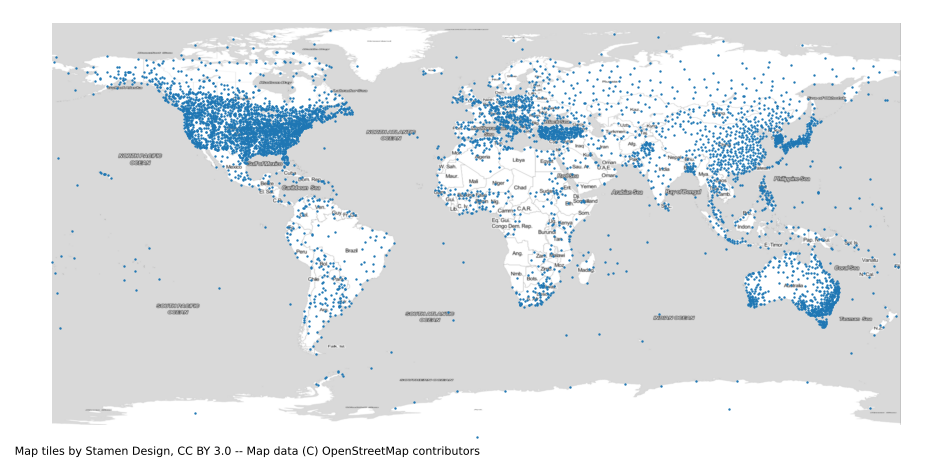

In [21]:
ax = stations.plot(markersize=0.5, figsize=(12,6));
ctx.add_basemap(ax, crs=stations.crs,
               source = ctx.providers.Stamen.TonerLite)
ax.axis('off');

Clip the stations to just those located within contiguous USA.

In [22]:
usa_stations = gpd.sjoin(stations, contiguous_usa, how='inner', op='within')

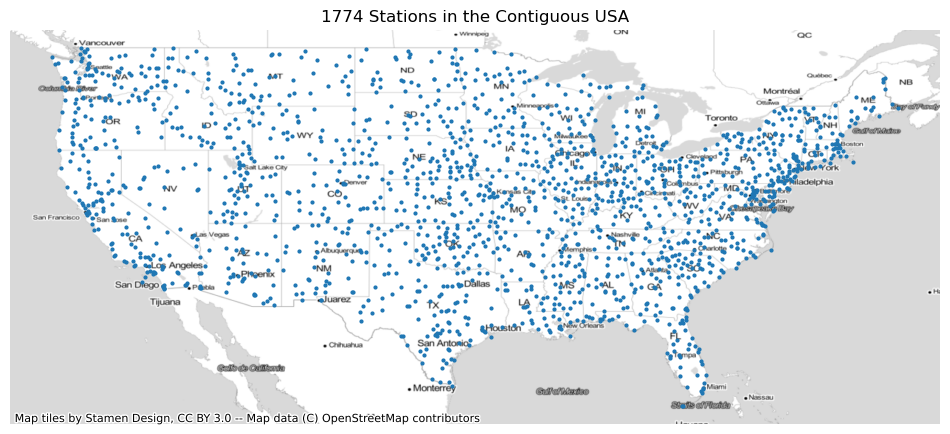

In [23]:
ax = usa_stations.plot(markersize=4, figsize=(12,6));
ctx.add_basemap(ax, crs=stations.crs,
               source = ctx.providers.Stamen.TonerLite)
ax.set_title(str(len(usa_stations)) + " Stations in the Contiguous USA")
ax.axis('off');

In [24]:
print(usa_stations['station_id'].nunique(), "stations in the Contiguous USA.")

1774 stations in the Contiguous USA.


## Monthly Maximum Temperature

Read in the monthly maximum temperature data.

In [25]:
filepath = "./data/ghcnm.v3.3.0.20190817/ghcnm.tmax.v3.3.0.20190817.qca.dat"

In [26]:
max_temp = read_ghcnm_data(filepath)

100%|███████████████████████████████| 333294/333294 [00:01<00:00, 188681.20it/s]


Get the monthly maximum temperature data for just the USA based stations.

In [27]:
usa_max_temp = max_temp[max_temp['station_id'].isin(list(usa_stations['station_id']))]

## Monthly Minimum Temperature

Read in the monthly minimum temperature data.

In [28]:
filepath = "./data/ghcnm.v3.3.0.20190817/ghcnm.tmin.v3.3.0.20190817.qca.dat"

In [29]:
min_temp = read_ghcnm_data(filepath)

100%|███████████████████████████████| 334473/334473 [00:01<00:00, 190639.82it/s]


Get the monthly minimum temperature data for just the USA based stations.

In [30]:
usa_min_temp = min_temp[min_temp['station_id'].isin(list(usa_stations['station_id']))]

## Identify Long Running Stations

We will only consider contiguous USA-based stations that came online in 1920 or before, and have recorded data through at least 2015 so that we can analyze long-term trends.

In [31]:
start_threshold = '1920-01-01'
end_threshold = '2016-01-01'

So identify the long-running USA stations with max temp data covering at least 1920 through 2015.

In [32]:
usa_stations_start_date_max_temp = usa_max_temp.dropna().groupby('station_id').min()['ds']
usa_stations_end_date_max_temp = usa_max_temp.dropna().groupby('station_id').max()['ds']

In [33]:
usa_stations = pd.merge(usa_stations, usa_stations_start_date_max_temp, how='left', left_on='station_id', right_index=True)
usa_stations.rename(columns={'ds':'start_date_max_temp'}, inplace=True)

In [34]:
usa_stations = pd.merge(usa_stations, usa_stations_end_date_max_temp, how='left', left_on='station_id', right_index=True)
usa_stations.rename(columns={'ds':'end_date_max_temp'}, inplace=True)

In [35]:
long_running_usa_stations_max_temp = usa_stations[(usa_stations['start_date_max_temp'] <= start_threshold) & \
                                         (usa_stations['end_date_max_temp'] >= end_threshold)]

And identify the long-running USA stations with min temp data covering at least 1920 through 2015.

In [36]:
usa_stations_start_date_min_temp = usa_min_temp.dropna().groupby('station_id').min()['ds']
usa_stations_end_date_min_temp = usa_min_temp.dropna().groupby('station_id').max()['ds']

In [37]:
usa_stations = pd.merge(usa_stations, usa_stations_start_date_min_temp, how='left', left_on='station_id', right_index=True)
usa_stations.rename(columns={'ds':'start_date_min_temp'}, inplace=True)

In [38]:
usa_stations = pd.merge(usa_stations, usa_stations_end_date_min_temp, how='left', left_on='station_id', right_index=True)
usa_stations.rename(columns={'ds':'end_date_min_temp'}, inplace=True)

In [39]:
long_running_usa_stations_min_temp = usa_stations[(usa_stations['start_date_min_temp'] <= start_threshold) & \
                                         (usa_stations['end_date_min_temp'] >= end_threshold)]

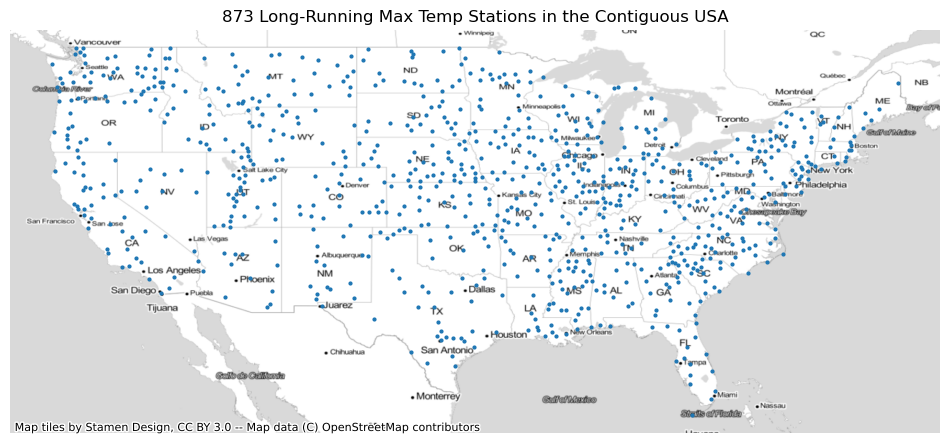

In [40]:
ax = long_running_usa_stations_max_temp.plot(markersize=4, figsize=(12,6));
ctx.add_basemap(ax, crs=stations.crs,
               source = ctx.providers.Stamen.TonerLite)
ax.set_title(str(len(long_running_usa_stations_max_temp)) + " Long-Running Max Temp Stations in the Contiguous USA")
ax.axis('off');

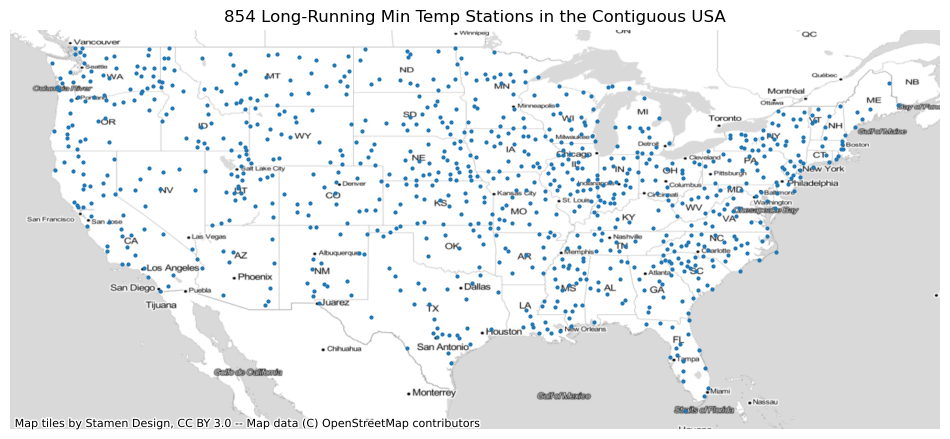

In [41]:
ax = long_running_usa_stations_min_temp.plot(markersize=4, figsize=(12,6));
ctx.add_basemap(ax, crs=stations.crs,
               source = ctx.providers.Stamen.TonerLite)
ax.set_title(str(len(long_running_usa_stations_min_temp)) + " Long-Running Min Temp Stations in the Contiguous USA")
ax.axis('off');

# Trend Analysis

## Helper Functions

In [42]:
def trend_test(df, stations, start_date=None, end_date=None, period=12, alpha=0.10, min_samples=60):
    '''
    Computes the Seasonal Mann-Kendall Test for a list of station ids.
    Returns a GeoDataFrame containing the following:
        1) Trend detection result (increasing, decreasing or no trend)
        2) Seasonal Theil-Sen's Slope Estimator,
        3) Intercept of Kendall-Theil Robust Line
        4) p-value of the significance test
    '''
    station_ids = list(stations['station_id'].values)
    
    trends = []
    slopes = []
    intercepts = []
    pvalues = []
    lats = []
    lons = []
    ids = []
   
    for i in station_ids:
        subset = df.query(f"station_id == '{i}'").copy()
        if start_date:
            subset = subset[subset['ds'] >= start_date]
        if end_date:
            subset = subset[subset['ds'] <= end_date]
        if len(subset.dropna()) < min_samples:
            pass
        else:
            values = subset['y']
            result = mk.seasonal_test(values, period=period, alpha=alpha)
            trends.append(result.trend)
            slopes.append(result.slope)
            intercepts.append(result.intercept)
            pvalues.append(result.p)
            lat = float(stations.query(f"station_id == '{i}'")['lat'].values[0])
            lon = float(stations.query(f"station_id == '{i}'")['lon'].values[0])
            lats.append(lat)
            lons.append(lon)
            ids.append(i)
        
    results = pd.DataFrame()
    results['station_id'] = ids
    results['trend'] = trends
    results['slope'] = slopes
    results['intercept'] = intercepts
    results['pvalue'] = pvalues
    results['start_date'] = start_date
    results['end_date'] = end_date
    results['lat'] = lats
    results['lon'] = lons
    geoms = gpd.points_from_xy(results['lon'], results['lat'])
    results = gpd.GeoDataFrame(results, geometry=geoms, crs=4326)
    return results

In [43]:
def plot_data(data, subtitle, show=True, output_dir=None, binwidth=0.01, xlim=(-3.0, 3.0)):
    df = data.copy()
    df['trend'] = df['trend'].apply(lambda x: x.replace("no trend", "non-significant"))

    # Define color scheme
    colors_dict={'increasing': 'red', 'decreasing': 'blue', 'non-significant': 'gray'}
    df['color'] = df['trend'].apply(lambda x: colors_dict[x])

    # Create figure
    figsize=(12, 9)
    fig = plt.figure(figsize=figsize, constrained_layout=False, dpi=600)
    gs = fig.add_gridspec(22, 22)
    
    # Map
    ax = fig.add_subplot(gs[0:22, 0:21], projection=ccrs.AlbersEqualArea(central_latitude=39.5, central_longitude=-98.35))
    plt.suptitle('Surface Station Temperature Trends', fontsize=24, y=0.95, x=0.05, horizontalalignment='left', fontweight='bold')
    plt.title(subtitle, fontsize=13, y=1.03, x=0.07, horizontalalignment='left', fontweight='light')

    # Set extent
    minx, miny, maxx, maxy = contiguous_usa['geometry'].bounds.iloc[0].values
    extent = [minx, maxx, miny, maxy]
    ax.set_extent(extent, crs=ccrs.PlateCarree())

    # Add USA border
    ax.add_geometries(contiguous_usa_prettified.geometry, crs = ccrs.PlateCarree(),
                      edgecolor='black', facecolor='white', linewidth=0.5, zorder=1)

    # Add USA State borders
    ax.add_geometries(contiguous_usa_states_prettified.geometry, crs = ccrs.PlateCarree(),
                      edgecolor='black', alpha=0.2, facecolor='white', linewidth=0.5, zorder=1)
    
    # Create vector field for stations with trends
    df['u'] = df['slope']
    df['v'] = df['slope'].apply(lambda x: np.abs(x)*0.0005)
    df['v'] = df['v'] * np.sqrt(df['lon']**2)**1.5
    x = df['lon']
    y = df['lat']
    u = df['u']
    v = df['v']
    color = df['color']
    ax.quiver(x, y, u, v, color=color,transform=ccrs.PlateCarree(), zorder=5, width=0.002)
    ax.axis('off')
    
    # Histogram
    ax2 = fig.add_subplot(gs[10:19:, 18:22])
    df['slope_per_decade'] = df.slope * 10
    g = sns.histplot(data=df, x='slope_per_decade', hue='trend', hue_order=['decreasing', 'non-significant', 'increasing'], palette=colors_dict, 
                     binwidth=binwidth, fill=True, ax=ax2, kde=True, stat='percent', legend=False, alpha=0.5)
    ax2.set_xlim(xlim)
    ax2.set_yticks([])
    ax2.axvline(0, color='black', linestyle='--', linewidth=1)
    ax2.set_xlabel("Trends (°C/Decade)", fontsize=8)
    ax2.set_ylabel('')
    ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    plt.xticks(fontsize=8)

    # Composition bar
    ax3 = fig.add_subplot(gs[19:20:, 2:17])
    composition = pd.DataFrame(df['trend'].value_counts(normalize=True)).transpose()
    if 'decreasing' not in composition.columns:
        composition['decreasing'] = 0
    composition = composition[['decreasing', 'non-significant', 'increasing']]
    hbars = composition.plot.barh(stacked=True,ax=ax3, label=False, legend=False, color=['blue', 'gray', 'red'], alpha=0.7)
    label_1 = '{:,.0%}'.format(hbars.patches[1].get_x())
    label_2 = '{:,.0%}'.format(hbars.patches[2].get_x() - hbars.patches[1].get_x())
    label_3 = '{:,.0%}'.format(1-hbars.patches[2].get_x())
    if composition['non-significant'].values[0] < 0.20:
        decr_label = 'Decr.'
        non_sig_label = 'Non-Sig.'
    else:
        decr_label = 'Decreasing'
        non_sig_label = 'Non-Significant'
    if composition['decreasing'].values[0] < 0.02:
        decr_label = 'Decr.'
    else:
        decr_label = 'Decreasing'
    ax3.text(hbars.patches[0].get_x()+hbars.patches[0].get_width()/2, hbars.patches[0].get_y()+hbars.patches[0].get_height()/2*0.44-0.8, 
             label_1, color='blue', fontweight='bold', fontsize=10, horizontalalignment='center')
    ax3.text(hbars.patches[0].get_x()+hbars.patches[0].get_width()/2, hbars.patches[0].get_y()+hbars.patches[0].get_height()/2*3, 
             decr_label, color='blue', fontweight='bold', fontsize=8, horizontalalignment='center')
    ax3.text(hbars.patches[1].get_x()+hbars.patches[1].get_width()/2, hbars.patches[1].get_y()+hbars.patches[1].get_height()/2*0.44-0.8, 
             label_2, color='gray', fontweight='bold', fontsize=10, horizontalalignment='center')
    ax3.text(hbars.patches[1].get_x()+hbars.patches[1].get_width()/2, hbars.patches[1].get_y()+hbars.patches[1].get_height()/2*3, 
             non_sig_label, color='gray', fontweight='bold', fontsize=8, horizontalalignment='center')
    ax3.text(hbars.patches[2].get_x()+hbars.patches[2].get_width()/2, hbars.patches[2].get_y()+hbars.patches[2].get_height()/2*0.44-0.8, 
             label_3, color='red', fontweight='bold', fontsize=10, horizontalalignment='center')
    ax3.text(hbars.patches[2].get_x()+hbars.patches[2].get_width()/2, hbars.patches[2].get_y()+hbars.patches[2].get_height()/2*3, 
             'Increasing', color='red', fontweight='bold', fontsize=8, horizontalalignment='center')
    ax3.spines['top'].set_visible(False)
    ax3.spines['left'].set_visible(False)
    ax3.spines['right'].set_visible(False)
    ax3.spines['bottom'].set_visible(False)
    ax3.set_yticks([])
    ax3.set_xticks([])
    ax3.set_xlim(0, 1)
    
    # Add footnotes
    plt.annotate("Analysis by Will Geary (@wgeary). Code available at github.com/willgeary/SurfaceTempTrends.", (-0.03,-2.6), fontsize=9, annotation_clip=False)
    plt.annotate("Data from Global Historical Climatology Network monthly (GHCNm) v3 quality controlled adjusted data.", (-0.03,-3.2), fontsize=9, annotation_clip=False)
    plt.annotate("Trend detection based on Seasonal Mann-Kendall Test at α=0.10 level of significance (Hirsch et al., 1982).", (-0.03,-3.8), fontsize=9, annotation_clip=False)
    plt.annotate("Trend magnitude calculated using Seasonal Theil-Sen's Slope Estimator (Hipel, 1994).", (-0.03,-4.4), fontsize=9, annotation_clip=False)
    plt.annotate("The length of each arrow represents the trend magnitude (longer arrows = greater magnitude).", (-0.03,-5.0), fontsize=9, annotation_clip=False)
    
    fig.subplots_adjust(top = 0.95)
    fig.subplots_adjust(left = -.01)
    
    if (output_dir and end_date):
        fig.savefig(f"outputs/{output_dir}/{start_date.strftime('%Y-%m')}_{end_date.strftime('%Y-%m')}.png", 
                    facecolor=fig.get_facecolor(), transparent=False)
    elif output_dir:
        fig.savefig(f"outputs/{output_dir}/{subtitle}.png", 
                    facecolor=fig.get_facecolor(), transparent=False)
    else:
        fig.savefig(f"outputs/{start_date.strftime('%Y-%m')}_{end_date.strftime('%Y-%m')}.png", 
                    facecolor=fig.get_facecolor(), transparent=False)
    
    if show:
        plt.show()
    else:
        plt.close()

## Overall Trend in Max Temp since 1920

In [44]:
start_date = '1920-01-01'
end_date = None

In [45]:
usa_max_temp_trends_since_1920 = trend_test(usa_max_temp, 
                                stations=long_running_usa_stations_max_temp,
                                start_date=start_date)

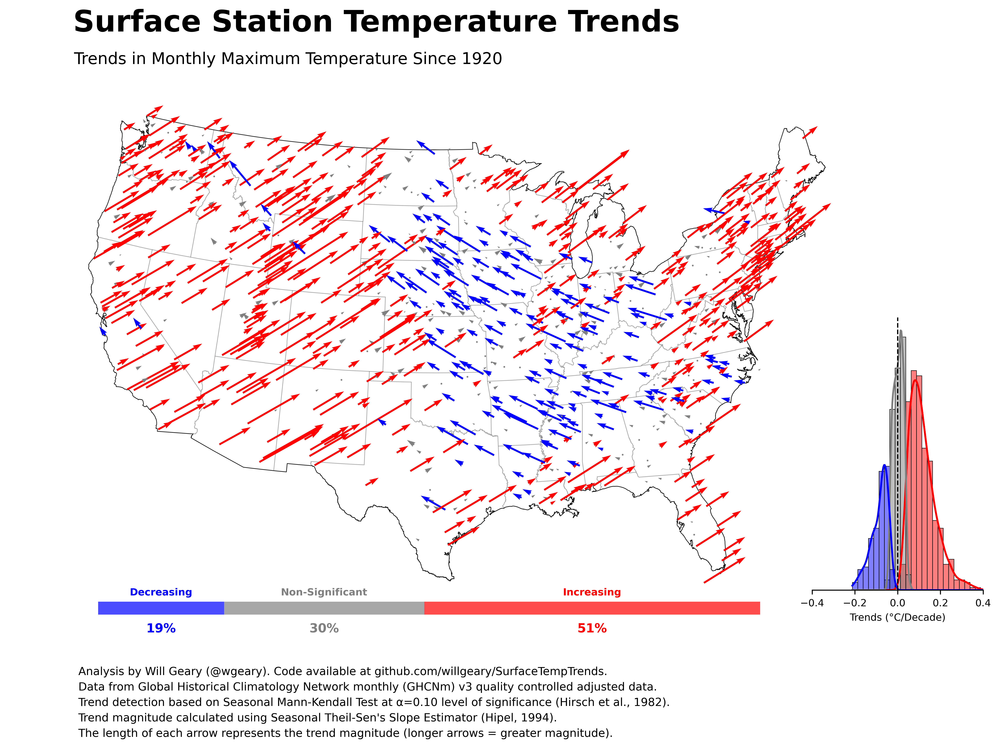

In [46]:
plot_data(usa_max_temp_trends_since_1920, 
              subtitle=f'Trends in Monthly Maximum Temperature Since 1920',
              binwidth=0.025,
              xlim=(-0.4, 0.4),
              show=True,
              output_dir="trends")

## Overall Trend in Max Temp since 2000

In [47]:
start_date = '2000-01-01'
end_date = None

In [48]:
usa_max_temp_trends_since_2000 = trend_test(usa_max_temp, 
                                stations=long_running_usa_stations_max_temp,
                                start_date=start_date)

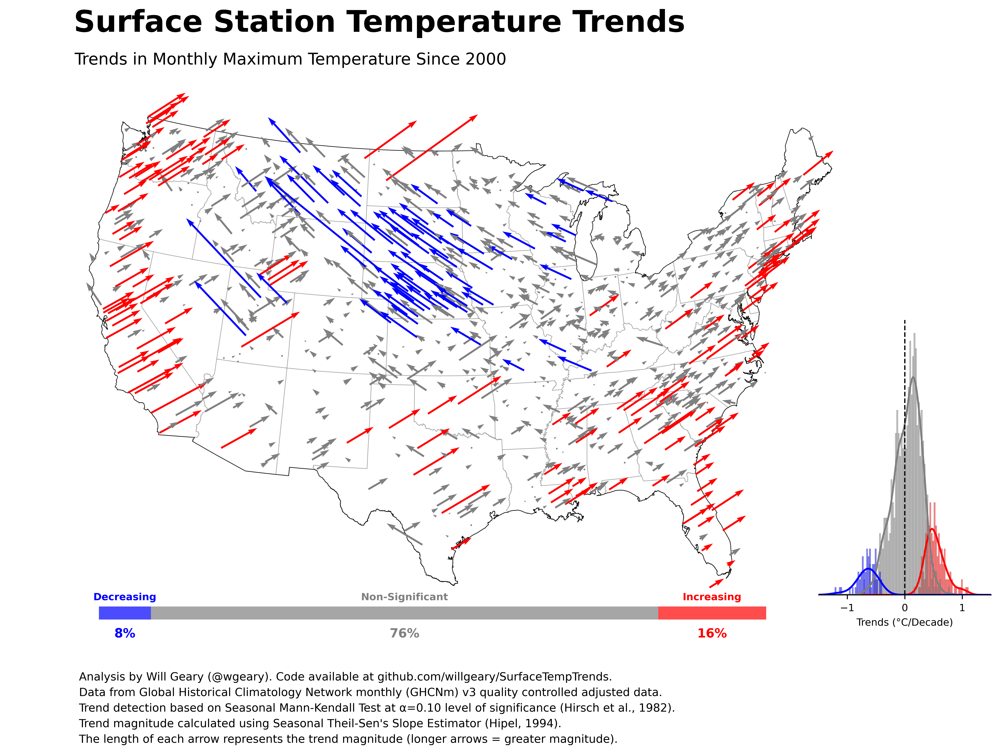

In [49]:
plot_data(usa_max_temp_trends_since_2000, 
              subtitle=f'Trends in Monthly Maximum Temperature Since 2000',
              binwidth=0.025,
              xlim=(-1.5, 1.5),
              show=True,
              output_dir="trends")

## Overall Trend in Min Temp since 1920

In [50]:
start_date = '1920-01-01'
end_date = None

In [51]:
usa_min_temp_trends_since_1920 = trend_test(usa_min_temp, 
                                stations=long_running_usa_stations_min_temp,
                                start_date=start_date)

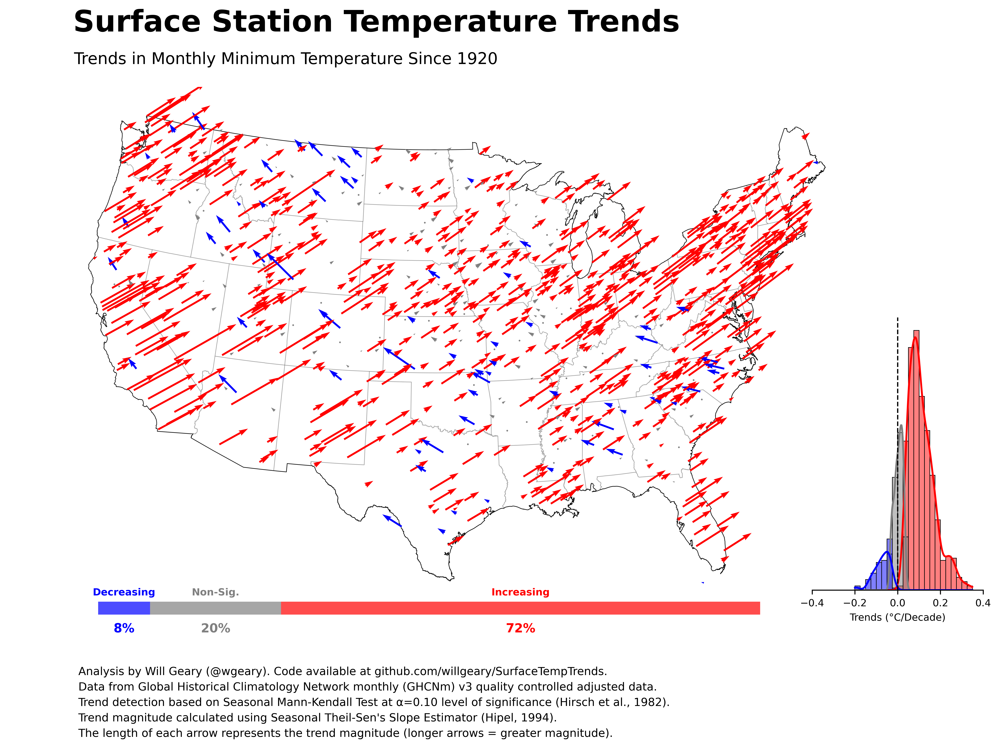

In [52]:
plot_data(usa_min_temp_trends_since_1920, 
              subtitle=f'Trends in Monthly Minimum Temperature Since 1920',
              binwidth=0.025,
              xlim=(-0.4, 0.4),
              show=True,
              output_dir="trends")

## Overall Trend in Min Temp since 2000

In [53]:
start_date = '2000-01-01'
end_date = None

In [54]:
usa_min_temp_trends_since_2000 = trend_test(usa_min_temp, 
                                stations=long_running_usa_stations_min_temp,
                                start_date=start_date)

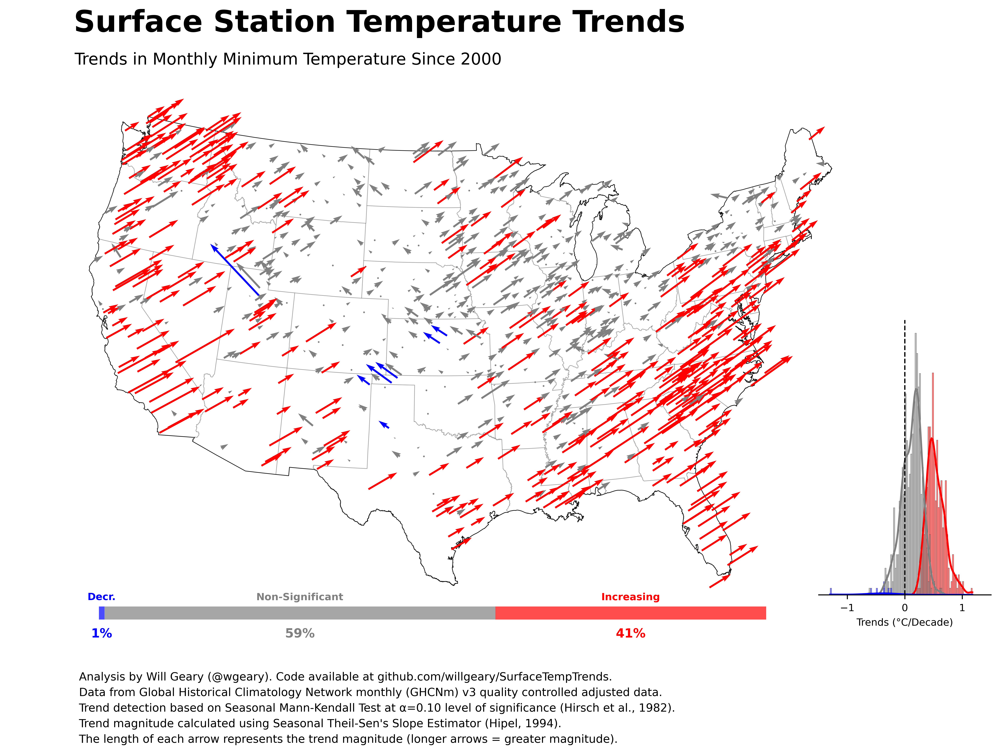

In [55]:
plot_data(usa_min_temp_trends_since_2000, 
              subtitle=f'Trends in Monthly Minimum Temperature Since 2000',
              binwidth=0.025,
              xlim=(-1.5, 1.5),
              show=True,
              output_dir="trends")

## Trailing 10 Year Trends in Max Temp

Loop through every month from 1920 onwards and analyze 10 year trailing trends. This takes several hours.

In [ ]:
dt = '1920-01-01'

# Convert to datetime
dt = pd.to_datetime(dt)

# Create date range
date_range = pd.date_range(dt, usa_max_temp.dropna().index.max()+pd.DateOffset(months=1), freq='m')

# Set dates to beginning of month
date_range = [pd.to_datetime(i.to_numpy().astype('datetime64[M]')) for i in date_range]

In [ ]:
for dt in tqdm(date_range):
    start_date = dt + pd.DateOffset(years=-10)
    end_date = dt
    usa_max_temp_trailing_trend = trend_test(usa_max_temp, 
                                stations=long_running_usa_stations_max_temp,
                                start_date=start_date,
                                end_date=end_date)
    plot_data(usa_max_temp_trailing_trend, 
              subtitle=f'Trends in Monthly Maximum Temperature Over Trailing 10 Years, {end_date.strftime("%b %Y")}',
              binwidth=0.1,
              show=False,
              output_dir="trailing_10_years_max")

## Trailing 10 Year Trends in Min Temp

Loop through every month from 1920 onwards and analyze 10 year trailing trends. This takes several hours.

In [ ]:
dt = '1920-01-01'

# Convert to datetime
dt = pd.to_datetime(dt)

# Create date range
date_range = pd.date_range(dt, usa_min_temp.dropna().index.max()+pd.DateOffset(months=1), freq='m')

# Set dates to beginning of month
date_range = [pd.to_datetime(i.to_numpy().astype('datetime64[M]')) for i in date_range]

In [ ]:
for dt in tqdm(date_range):
    start_date = dt + pd.DateOffset(years=-10)
    end_date = dt
    usa_min_temp_trailing_trend = trend_test(usa_min_temp, 
                                stations=long_running_usa_stations_min_temp,
                                start_date=start_date,
                                end_date=end_date)
    plot_data(usa_min_temp_trailing_trend, 
              subtitle=f'Trends in Monthly Minimum Temperature Over Trailing 10 Years, {end_date.strftime("%b %Y")}',
              binwidth=0.1,
              show=False,
              output_dir="trailing_10_years_min")